<br>
<font>
<div dir="ltr" align="center">
    <br>
    <font color="#E74C3C" size="7" style="font-family:Arial, sans-serif;">
        Kernels, Filters, and Convolution <br>
    </font>
    <font color="#2980B9" size="5" style="font-family:Arial, sans-serif;">
        Computer Vision <br>
    </font>
    <font color="#2980B9" size="5" style="font-family:Arial, sans-serif;">
        M Seyfipoor <br>
    </font>
    <font color="#2980B9" size="5" style="font-family:Arial, sans-serif;">
        Solution by Amir Vahedi <br>
    </font>
</div>


<br>
<font>
<div dir="ltr" align="center">
    <br>
    <font color="green" size="7" style="font-family:Arial, sans-serif;">
        Section #1<br>
    </font>
</div>


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from IPython.display import Image
import cv2

<h1 style="line-height:200%; font-family: Arial, sans-serif; color: #007acc; text-align: left;">
    <font face="Arial" color="#007acc">
        1D Convolution
    </font>
</h1>


1D convolution is a powerful technique widely used in machine learning, particularly in the analysis of sequential data like time-series signals, speech, and even stock prices. At its core, 1D convolution works by sliding a filter or kernel over a sequence of data points to detect patterns, extract features, or smooth the data. Unlike 2D convolution, which operates on grids (such as images), 1D convolution works on one-dimensional sequences, making it well-suited for problems where data is ordered in time or space.

<h2 style="line-height:200%; font-family: Arial, sans-serif; color: #007acc; text-align: left;">
    <font face="Arial" color="#007acc">
        How 1D Convolution Works
    </font>
</h2>


The basic idea of 1D convolution involves applying a kernel to a sequence of values. The kernel slides over the input sequence, performing element-wise multiplications followed by a sum. This produces a new sequence that highlights certain features based on the kernel used. For example, in time-series analysis, different kernels can detect trends, seasonal patterns, or sharp changes in the data.


The result of 1D convolution is a feature map, which is another sequence that represents important aspects of the input sequence. Depending on the choice of kernel, stride (the step size at which the kernel moves), and padding (how edges of the sequence are handled), 1D convolution can either downsample or retain the size of the original sequence.

There are various approaches to implementing 1D convolution, each with its own trade-offs in terms of computational efficiency and feature extraction. These approaches can be adapted to suit specific tasks and data characteristics.


<h2 style="line-height:200%; font-family: Arial, sans-serif; color: #007acc; text-align: left;">
    <font face="Arial" color="#007acc">
        Applications of 1D Convolution
    </font>
</h2>


1D convolution is applied in a variety of fields, making it a versatile tool in machine learning:
 
* <strong>Stock Price Prediction:</strong> 1D convolution is used to analyze historical price data and detect patterns such as upward or downward trends. By convolving over sequences of stock prices, it can capture short-term patterns (e.g., daily fluctuations) or long-term trends (e.g., month-to-month performance). Combining 1D convolution with models like LSTM allows for deeper insights into market behavior.

* <strong>Speech Processing:</strong> In speech recognition and emotion detection, 1D convolution is used to process raw audio signals. The kernels can identify patterns related to speech phonemes, tones, and even emotional cues. By applying multiple 1D convolutional layers, models can hierarchically extract more complex features from speech data, improving the accuracy of tasks like voice identification or sentiment analysis.

* <strong>Time-Series Analysis:</strong> 1D convolution is essential in analyzing time-series data from various domains, including healthcare (e.g., analyzing heart rate variability), industrial monitoring (e.g., detecting anomalies in sensor data), and environmental science (e.g., analyzing weather patterns). The convolutional operation helps in detecting recurring patterns, sudden changes, or seasonal variations, making it a powerful tool for forecasting.

* <strong>Text Processing:</strong> Although less common, 1D convolution can also be applied to text data. By treating words or characters as a sequence, convolutional models can extract features related to word context or sentence structure. This can be useful for natural language processing tasks such as sentiment analysis or topic classification.



For understanding the mathematics behind 1D convolution, We recommend watching this <a href="https://www.youtube.com/watch?v=KuXjwB4LzSA&t=443s" target="_blank" style="color:#007acc;">YouTube video</a>.


In [2]:
import numpy as np


def convolve_1d_two_loops(signal, kernel):
    """
    Convolve a 1D signal with a kernel using two loops.
    Args:
        signal: 1D array representing the input signal.
        kernel: 1D array representing the filter to apply to the signal.
    Returns:
        output: 1D array representing the convolution result.
    """
    signal_len = len(signal)
    kernel_len = len(kernel)
    pad_size = kernel_len // 2

    # Step 1: Zero-pad the signal on both sides to handle edge cases
    padded_signal = np.pad(signal, (pad_size, pad_size), 'constant', constant_values=0)

    # Step 2: Reverse the kernel for the convolution operation
    reversed_kernel = kernel[::-1]

    output_len = signal_len
    output = np.zeros(output_len)

    # Step 3: Perform convolution by sliding the kernel across the padded signal using two loops
    for i in range(output_len):
        for j in range(kernel_len):
            output[i] += padded_signal[i + j] * reversed_kernel[j]

    return output


In [3]:
import numpy as np

def convolve_1d_one_loops(signal, kernel):
    """
    Convolve a 1D signal with a kernel using a single loop (optimized version).
    Args:
        signal: 1D array representing the input signal.
        kernel: 1D array representing the filter to apply to the signal.
    Returns:
        output: 1D array representing the convolution result.
    """
    signal_len = len(signal)
    kernel_len = len(kernel)
    pad_size = kernel_len // 2

    # Step 1: Zero-pad the signal on both sides
    padded_signal = np.pad(signal, (pad_size, pad_size), 'constant', constant_values=0)

    # Step 2: Reverse the kernel for convolution
    reversed_kernel = kernel[::-1]

    output_len = signal_len
    output = np.zeros(output_len)

    # Step 3: Perform convolution using a single loop and vectorized operations like sum
    for i in range(output_len):
        output[i] = np.sum(padded_signal[i:i + kernel_len] * reversed_kernel)

    return output


In [4]:
import numpy as np

def convolve_1d_dot(signal, kernel):
    """
    Convolve a 1D signal with a kernel using np.dot (fast and vectorized).
    Args:
        signal: 1D array representing the input signal.
        kernel: 1D array representing the filter to apply to the signal.
    Returns: 
        output: 1D array representing the convolution result.
    """
    signal_len = len(signal)
    kernel_len = len(kernel)
    pad_size = kernel_len // 2

    # Step 1: Zero-pad the signal
    padded_signal = np.pad(signal, (pad_size, pad_size), 'constant', constant_values=0)

    # Step 2: Reverse the kernel
    reversed_kernel = kernel[::-1]

    output_len = signal_len
    output = np.zeros(output_len)

    # Step 3: Perform vectorized convolution using dot product
    for i in range(output_len):
        output[i] = np.dot(padded_signal[i:i + kernel_len], reversed_kernel)

    return output


In [5]:
import numpy as np

def fft_convolve_vectorized(signal, kernel):
    """
    Convolve a 1D signal with a kernel using Fast Fourier Transform (FFT).
    Args:
        signal: 1D array representing the input signal.
        kernel: 1D array representing the filter to apply to the signal.
    Returns:
        output: 1D array representing the convolution result using FFT.
    """
    signal_len = len(signal)
    kernel_len = len(kernel)
    
    # Step 1: Zero-pad both the signal and kernel to the convolution length
    conv_len = signal_len + kernel_len - 1
    padded_signal = np.pad(signal, (0, conv_len - signal_len), 'constant')
    padded_kernel = np.pad(kernel, (0, conv_len - kernel_len), 'constant')
    
    # Step 2: Perform FFT on both padded signal and kernel
    signal_fft = np.fft.fft(padded_signal)
    kernel_fft = np.fft.fft(padded_kernel)
    
    # Step 3: Element-wise multiplication in the frequency domain
    result_fft = signal_fft * kernel_fft
    
    # Step 4: Perform inverse FFT to get the result in the time domain
    result = np.fft.ifft(result_fft)
    
    # Step 5: Return the real part of the result to remove small imaginary parts
    return np.real(result)[int(np.ceil(kernel_len / 2)) - 1: int(np.ceil(kernel_len / 2)) + signal_len - 1]

In [6]:
# Sanity check to verify that the functions return similar results
signal = np.array([1, 2, 3, 4, 5])
kernel = np.array([1, 0, -1])
signal_len = len(signal)
kernel_len = len(kernel)

print("Sanity Check: Comparing Results")
print("Two loops:", convolve_1d_two_loops(signal, kernel))
print("One loop:", convolve_1d_one_loops(signal, kernel))
print("Dot product:", convolve_1d_dot(signal, kernel))
print("FFT vectorized:", fft_convolve_vectorized(signal, kernel))
print("numpy function:", np.convolve(signal, kernel)[int(np.ceil(kernel_len / 2)) - 1: int(np.ceil(kernel_len / 2)) + signal_len - 1])

Sanity Check: Comparing Results
Two loops: [ 2.  2.  2.  2. -4.]
One loop: [ 2.  2.  2.  2. -4.]
Dot product: [ 2.  2.  2.  2. -4.]
FFT vectorized: [ 2.  2.  2.  2. -4.]
numpy function: [ 2  2  2  2 -4]


<h2 style="line-height:200%; font-family: Arial, sans-serif; color: #007acc; text-align: left;">
    <font face="Arial" color="#007acc">
        Assignment Questions
    </font>
</h2>

<p style="direction: ltr; text-align: justify; line-height: 1.6; font-family: Arial, sans-serif; font-size: medium;">
    <font face="Arial" size="3">
        In this section, we will explore the features that different kernels are designed to extract. For each kernel provided, identify what type of feature or pattern the kernel is trying to detect in a sequence.
    </font>
</p>

#### **1. Kernel: `[1, -1]`**

**Answer:**

*این کرنل برای تشخیص لبه‌ها استفاده می‌شود و اختلاف بین مقادیر مجاور را بزرگ می‌کند.*

---

#### **2. Kernel: `[1, 1, 1]`**

**Answer:**

*این کرنل یک فیلتر میانگین گیر است که مقادیر اطراف را میانگین می‌گیرد*

---

#### **3. Kernel: `[0.25, 0.25, 0.25, 0.25]`**

**Answer:**

*این کرنل نیز یک فیلتر میانگین گیر است که مقادیر را به طور مساوی میانگین و نرمال شده می‌گیرد.*

---

#### **4. Kernel: `[-1, 2, -1]`**

**Answer:**

*این کرنل برای تشخیص لبه‌ها و تغییرات شدید در سیگنال استفاده می‌شود.*

---

#### **5. Kernel: `[1, 0, -1]`**

**Answer:**

* این کرنل نیز برای تشخیص لبه‌ها در جهت افقی استفاده می‌شود.*


In [7]:
import numpy as np
import timeit

def benchmark_convolution(signal_len, kernel_len, iterations):
    """
    Measure the average execution time of different convolution methods over a number of iterations.
    Args:
        signal_len: Length of the random input signal.
        kernel_len: Length of the random kernel.
        iterations: Number of times each method should be run to average the time.
    Returns:
        Tuple of average times for each method.
    """
    # Generate random signal and kernel for benchmarking
    np.random.seed(42)  # For reproducibility
    random_signal = np.random.rand(signal_len)
    random_kernel = np.random.rand(kernel_len)

    # Define convolution methods
    def convolve_1d_two_loops(signal, kernel):
        signal_len = len(signal)
        kernel_len = len(kernel)
        pad_size = kernel_len // 2
        padded_signal = np.pad(signal, (pad_size, pad_size), 'constant', constant_values=0)
        reversed_kernel = kernel[::-1]
        output_len = signal_len
        output = np.zeros(output_len)
        for i in range(output_len):
            for j in range(kernel_len):
                output[i] += padded_signal[i + j] * reversed_kernel[j]
        return output

    def convolve_1d_one_loops(signal, kernel):
        signal_len = len(signal)
        kernel_len = len(kernel)
        pad_size = kernel_len // 2
        padded_signal = np.pad(signal, (pad_size, pad_size), 'constant', constant_values=0)
        reversed_kernel = kernel[::-1]
        output_len = signal_len
        output = np.zeros(output_len)
        for i in range(output_len):
            output[i] = np.sum(padded_signal[i:i + kernel_len] * reversed_kernel)
        return output

    def convolve_1d_dot(signal, kernel):
        signal_len = len(signal)
        kernel_len = len(kernel)
        pad_size = kernel_len // 2
        padded_signal = np.pad(signal, (pad_size, pad_size), 'constant', constant_values=0)
        reversed_kernel = kernel[::-1]
        output_len = signal_len
        output = np.zeros(output_len)
        for i in range(output_len):
            output[i] = np.dot(padded_signal[i:i + kernel_len], reversed_kernel)
        return output

    def fft_convolve_vectorized(signal, kernel):
        signal_len = len(signal)
        kernel_len = len(kernel)
        conv_len = signal_len + kernel_len - 1
        padded_signal = np.pad(signal, (0, conv_len - signal_len), 'constant')
        padded_kernel = np.pad(kernel, (0, conv_len - kernel_len), 'constant')
        signal_fft = np.fft.fft(padded_signal)
        kernel_fft = np.fft.fft(padded_kernel)
        result_fft = signal_fft * kernel_fft
        result = np.fft.ifft(result_fft)
        return np.real(result)[:signal_len]

    def numpy_convolve(signal, kernel):
        return np.convolve(signal, kernel, mode='same')

    # Measure the average execution time for each method
    time_two_loops = timeit.timeit(lambda: convolve_1d_two_loops(random_signal, random_kernel), number=iterations) / iterations
    time_one_loop = timeit.timeit(lambda: convolve_1d_one_loops(random_signal, random_kernel), number=iterations) / iterations
    time_dot = timeit.timeit(lambda: convolve_1d_dot(random_signal, random_kernel), number=iterations) / iterations
    time_fft = timeit.timeit(lambda: fft_convolve_vectorized(random_signal, random_kernel), number=iterations) / iterations
    time_np_convolve = timeit.timeit(lambda: numpy_convolve(random_signal, random_kernel), number=iterations) / iterations

    return (time_two_loops, time_one_loop, time_dot, time_fft, time_np_convolve)

# Input the number of iterations
num_iterations = 1000

# Run benchmark and print results
signal_len = 500
kernel_len = 20
avg_times = benchmark_convolution(signal_len, kernel_len, num_iterations)
print(f"\nAverage times over {num_iterations} iterations (in seconds):")
print(f"Two loops: {avg_times[0]}")
print(f"One loop: {avg_times[1]}")
print(f"Dot product: {avg_times[2]}")
print(f"FFT vectorized: {avg_times[3]}")
print(f"NumPy convolve: {avg_times[4]}")



Average times over 1000 iterations (in seconds):
Two loops: 0.005592263394999463
One loop: 0.0030423053260001326
Dot product: 0.0010159423320001224
FFT vectorized: 0.00021567483699982403
NumPy convolve: 1.3494661000549968e-05


<h2 style="line-height:200%; font-family: Arial, sans-serif; color: #007acc; text-align: left;">
    <font face="Arial" color="#007acc">
        Assignment Questions
    </font>
</h2>

#### **1. Performance Comparison of Convolution Methods**

After running the convolution methods, compare the average times. Which method was the fastest, and which was the slowest? Explain why this might be the case based on the underlying algorithm used by each method.

**Answer:**

*سریع ترین الگوریتم پیاده سازی نامپای برای کانولوشن است و کند ترین الگوریتم همان الگوریتم دو حلقه ای است. پیاده سازی بر اساس حلقه کند تر است از انجام دات پروداکت زیرا این الگوریتم ها پیاده سازی بهینه در کتابخانه دارند. الگوریتم تبدیل فوریه سریع هم سریع تر از دات پروداکت و کند تر از پیاده سازی نامپای است.*

---

#### **2. FFT Convolution Time Complexity**

You may have noticed that the FFT-based convolution is much faster than the others for longer signals. Can you describe the time complexity of the FFT convolution? Why is this method more efficient for larger input sizes?

**Answer:**

*time complexity of FTT convolution is O(n*log(n)), while the time complexity of slower methods (2 loops, 1 loops, and dot product) are relativly O(kn) (k: kernel length, n: signal length). In slower methods of computing convolution, we tired to do the convolution in time domain, but, FTT do the convolution in frequency domain, which is more efficicent for larger signals.*

---

#### **3. Scaling with Signal Length and Kernel Length**

Try changing the values of `signal_len` and `kernel_len` (e.g., doubling both lengths). Is the relative performance of the methods (speed comparison) the same as before? Which methods are most affected by changes in the size of the signal or kernel?

**Answer:**

*As we have showed, the time complexity of slower methods are O(kn), while FFT has the time complexity of O(nlgn), therefore, for large n, the difference between the performance of FFT and other methods become more significant.*

---

#### **4. Optimal Use Case for FFT Convolution**

Based on the results of your experiments, when would it be best to use the FFT-based convolution versus one of the other methods? Consider factors like signal length, kernel length, and computational resources.

**Answer:**

*For long signals and long kernels, FFT is the best, but this method requires more memory compared to iterative approaches. Iterative method is best for short signals and short kernels, but since it doesn't need that much memory, it can be used in memory-constraint devices.*

---

#### **5. NumPy Convolve vs Custom Implementations**

Compare the performance of the built-in `np.convolve` with your custom implementations (like the dot-product or one-loop versions). Why do you think the `np.convolve` function performs as it does? Could it be internally optimized, and if so, how?

**Answer:**

*np.convolve performs better than custom functions because it's optimized. It uses efficient libraries, manages memory well, and might use different methods based on the input size, like direct or FFT-based convolution. It also takes advantage of fast operations and can process data in parallel. Because of these smart optimizations, np.convolve is faster and more reliable, especially for large or complex tasks.*

---

#### **6. Interpretation of Results for Small Signal and Kernel Sizes**

For smaller values of `signal_len` and `kernel_len`, you might see different performance trends. Can you explain why the FFT method might not always be the best choice when working with smaller inputs?

**Answer:**

FFT convolution isn’t always best for small inputs because it has extra steps like padding and transforming. These steps can take more time than simpler methods when the data is small. So, for small signals or kernels, direct methods are often faster.

---


<h1 style="line-height:200%; font-family: Arial, sans-serif; color: #007acc; text-align: left;">
    <font face="Arial" color="#007acc">
        2D Convolution
    </font>
</h1>

2D convolution is a critical technique in image processing and other tasks where data is represented in two dimensions, such as images. In 2D convolution, a kernel (or filter) slides over a 2D input matrix to produce a feature map. This technique is used for tasks like edge detection, blurring, and pattern recognition in images.

<h1 style="line-height:200%; font-family: Arial, sans-serif; color: #007acc; text-align: left;">
    <font face="Arial" color="#007acc">
        How 2D Convolution Works
    </font>
</h1>

The process of 2D convolution involves applying a kernel to an input matrix by sliding the kernel over the matrix and performing element-wise multiplication followed by a sum. This operation results in a new matrix that highlights features based on the kernel used.


<h1 style="line-height:200%; font-family: Arial, sans-serif; color: #007acc; text-align: left;">
    <font face="Arial" color="#007acc">
        Applications of 2D Convolution
    </font>
</h1>

- **Image Processing**: 2D convolution is fundamental for operations like edge detection, sharpening, and smoothing in image processing. By applying different kernels, various features in the image can be emphasized or suppressed.
- **Feature Extraction in CNNs**: In Convolutional Neural Networks (CNNs), 2D convolution layers are used to extract features from images, which are then used for tasks like image classification, object detection, and segmentation.
- **Medical Imaging**: 2D convolution is used in medical imaging to enhance features or detect abnormalities in images such as MRI scans and X-rays.


For understanding the mathematics behind 2D convolution, We recommend watching [YouTube video](https://www.youtube.com/watch?v=O2CBKXr_Tuc).

In [8]:
import numpy as np

def convolve_2d_four_loops(image, kernel, stride=1, pad=0):
    """
    Perform 2D convolution using four nested loops.
    Args:
        image (numpy.ndarray): 2D array representing the input image.
        kernel (numpy.ndarray): 2D array representing the filter to apply to the image.
        stride (int): The stride of the convolution.
        pad (int): The amount of zero-padding added to the image.
    Returns:
        numpy.ndarray: 2D array representing the convolution result.
    """
    image_height, image_width = image.shape
    kernel_height, kernel_width = kernel.shape
    
    # Calculate the dimensions of the output feature map
    output_height = ((image_height - kernel_height + 2 * pad) // stride) + 1
    output_width = ((image_width - kernel_width + 2 * pad) // stride) + 1
    
    # Apply padding to the image using np.pad
    padded_image = np.pad(image, pad_width=pad, mode='constant', constant_values=0)
    
    # Initialize the output feature map
    output = np.zeros((output_height, output_width))
    
    # Perform convolution using four loops
    for y in range(output_height):
        for x in range(output_width):
            for ky in range(kernel_height):
                for kx in range(kernel_width):
                    output[y, x] += padded_image[y * stride + ky, x * stride + kx] * kernel[ky, kx]
    
    return output


In [9]:
import numpy as np

def convolve_2d_two_loops(image, kernel, stride=1, pad=0):
    """
    Convolve a 2D image with a kernel using two loops.
    Args:
        image: 2D array representing the input image.
        kernel: 2D array representing the filter to apply to the image.
    Returns:
        output: 2D array representing the convolution result.
    """
    image_height, image_width = image.shape
    kernel_height, kernel_width = kernel.shape

    # Calculate the dimensions of the output feature map
    output_height = ((image_height - kernel_height + 2 * pad) // stride) + 1
    output_width = ((image_width - kernel_width + 2 * pad) // stride) + 1

    # Apply padding to the image using np.pad
    padded_image = np.pad(image, pad_width=pad, mode='constant', constant_values=0)

    # Initialize the output feature map
    output = np.zeros((output_height, output_width))

    # Perform convolution by sliding the kernel across the padded image using two loops and vector operations
    for y in range(output_height):
        for x in range(output_width):
            output[y, x] = np.sum(
                padded_image[y * stride:y * stride + kernel_height, x * stride:x * stride + kernel_width] * kernel
            )

    return output


### Convolution Using im2col

The `im2col` method is a powerful technique used to convert convolution operations into matrix multiplications. This technique simplifies and speeds up convolution computations, which are fundamental in many image processing and deep learning tasks.

#### im2col Transformation:
The `im2col` technique involves extracting overlapping patches from the padded image, each corresponding to a position of the kernel. These patches are then flattened into column vectors.

### Multiplication
Once the image patches are transformed into the im2col matrix, convolution can be performed using matrix multiplication. Flatten the kernel matrix into a vector `k_vec`. The convolution result can then be obtained by multiplying the im2col matrix by `k_vec`.

<img src="https://www.researchgate.net/publication/364684841/figure/fig7/AS:11431281091934216@1666661734455/An-example-of-the-Im2col-convolution-optimization-algorithm-In-terms-of-FPGA-based.png" alt="Steve Jobs" style="width: 750px; height: auto;">


For an image matrix of size `H x W` and a kernel of size `kH x kW` with stride `S`, we can ask:

- **Question 1:**
  What will be the number of columns in the output matrix from the im2col transformation?

  **Answer:**

  *The number of columns in the output matrix from the im2col transformation is equal to the total number of positions where the kernel slides over the image. This is calculated by multiplying the height and width of the output matrix, which represent all possible positions of the kernel when it moves across the padded image*


- **Question 2:**
What will be the number of rows in the im2col matrix?

  **Answer:**

  *The number of rows in the im2col matrix corresponds to the total number of elements in the kernel. This means each column of the im2col matrix represents a flattened version of the kernel applied to a specific patch of the image.*



In [10]:
import numpy as np

def convolve_2d_im2col(image, kernel, stride=1, pad=0):

    # Obtain the dimensions of the image and kernel 
    image_height, image_width = image.shape
    kernel_height, kernel_width = kernel.shape
    
    # Calculate the dimensions of the output matrix
    out_height = (image_height + 2 * pad - kernel_height) // stride + 1
    out_width = (image_width + 2 * pad - kernel_width) // stride + 1

    # Pad the image
    padded_image = np.pad(image, ((pad, pad), (pad, pad)), mode='constant', constant_values=0)

    # Create the im2col matrix
    image_cols = np.zeros((kernel_height * kernel_width, out_height * out_width))
    
    for y in range(out_height):
        for x in range(out_width):
            patch = padded_image[y*stride:y*stride+kernel_height, x*stride:x*stride+kernel_width]
            image_cols[:, y*out_width + x] = patch.flatten()
    
    # Flatten the kernel
    kernel_flat = kernel.flatten()
    
    # Perform the convolution using matrix multiplication
    output_flat = kernel_flat @ image_cols
    
    # Reshape the output to the correct dimensions
    output = output_flat.reshape(out_height, out_width)
    
    return output


In [11]:
# Define a small image and kernel for testing
image = np.array([
    [1, 2, 3, 4],
    [5, 6, 7, 8],
    [9, 10, 11, 12],
    [13, 14, 15, 16]
])

kernel = np.array([
    [1, 0],
    [0, -1]
])

# Hyperparameters for convolution
stride = 1
pad = 1

# Sanity check
print("Sanity Check: Comparing Results for 2D Convolution")

# Perform convolution using four loops
result_four_loops = convolve_2d_four_loops(image, kernel, stride=stride, pad=pad)
print("Four loops:\n", result_four_loops)

# Perform convolution using two loops and vectorized operations
result_two_loops = convolve_2d_two_loops(image, kernel, stride=stride, pad=pad)
print("Two loops:\n", result_two_loops)

# Perform convolution using im2col transformation
result_im2col = convolve_2d_im2col(image, kernel, stride=stride, pad=pad)
print("im2col method:\n", result_im2col)


# Compare the results
if (np.allclose(result_four_loops, result_two_loops) and
    np.allclose(result_two_loops, result_im2col)):
    print("Sanity Check Passed: All methods produce similar results.")
else:
    print("Sanity Check Failed: The methods produce different results.")


Sanity Check: Comparing Results for 2D Convolution
Four loops:
 [[ -1.  -2.  -3.  -4.   0.]
 [ -5.  -5.  -5.  -5.   4.]
 [ -9.  -5.  -5.  -5.   8.]
 [-13.  -5.  -5.  -5.  12.]
 [  0.  13.  14.  15.  16.]]
Two loops:
 [[ -1.  -2.  -3.  -4.   0.]
 [ -5.  -5.  -5.  -5.   4.]
 [ -9.  -5.  -5.  -5.   8.]
 [-13.  -5.  -5.  -5.  12.]
 [  0.  13.  14.  15.  16.]]
im2col method:
 [[ -1.  -2.  -3.  -4.   0.]
 [ -5.  -5.  -5.  -5.   4.]
 [ -9.  -5.  -5.  -5.   8.]
 [-13.  -5.  -5.  -5.  12.]
 [  0.  13.  14.  15.  16.]]
Sanity Check Passed: All methods produce similar results.


In [12]:
import numpy as np
import timeit

def benchmark_2d_convolution(image_height, image_width, kernel_height, kernel_width, stride, pad, iterations):
    np.random.seed(42)
    random_image = np.random.rand(image_height, image_width)
    random_kernel = np.random.rand(kernel_height, kernel_width)

    # Measure the execution time for each method
    time_four_loops = timeit.timeit(
        lambda: convolve_2d_four_loops(random_image, random_kernel, stride, pad), 
        number=iterations
    ) / iterations
    time_two_loops = timeit.timeit(
        lambda: convolve_2d_two_loops(random_image, random_kernel, stride, pad), 
        number=iterations
    ) / iterations
    time_im2col = timeit.timeit(
        lambda: convolve_2d_im2col(random_image, random_kernel, stride, pad), 
        number=iterations
    ) / iterations

    return (time_four_loops, time_two_loops, time_im2col)

# Input the number of iterations
num_iterations = 200

# Run benchmark and print results
image_height = 50
image_width = 50
kernel_height = 4
kernel_width = 4
stride = 1
pad = 2
avg_times = benchmark_2d_convolution(image_height, image_width, kernel_height, kernel_width, stride, pad, num_iterations)
print(f"\nAverage times over {num_iterations} iterations (in seconds):")
print(f"Four loops: {avg_times[0]}")
print(f"Two loops: {avg_times[1]}")
print(f"im2col: {avg_times[2]}")



Average times over 200 iterations (in seconds):
Four loops: 0.03521515172999898
Two loops: 0.02101513352999973
im2col: 0.017893444790001923


### **Assignment Questions for 2D Convolution**

#### **1. Performance Comparison of 2D Convolution Methods**

After running the 2D convolution methods (four loops, two loops, and `im2col`), compare the average times. Which method was the fastest, and which was the slowest? Explain why this might be the case based on the underlying algorithm and memory usage of each method.

**Answer:**

*The im2col method is the fastest due to optimized matrix multiplication. Two loops are next, using vectorized operations. Four loops are the slowest because they have too many nested iterations, causing overhead and poor memory use.*

---

#### **2. Effect of Stride and Padding on Performance**

Try changing the values of `stride` and `pad`. How do these changes affect the performance of the different convolution methods? Which method shows the most significant performance change with varying stride and padding?

**Answer:**

*Changing stride and pad affects all methods, with im2col showing the most significant performance change. Larger strides and padding increase computation time due to more convolutions. im2col is sensitive due to increased matrix sizes and memory demands.*

---

#### **3. Scaling with Image and Kernel Size**

Change the `image_height`, `image_width`, `kernel_height`, and `kernel_width` values (e.g., double both). How does the performance scale with the size of the image and kernel? Which method is most affected by these changes?

**Answer:**

*(Students' answer here)*

---

#### **4. When to Use `im2col` Method**

Based on your experiments, when would you prefer to use the `im2col` method over the other methods? Consider factors like image size, kernel size, stride, padding, and computational efficiency.

**Answer:**

*increases computation time for all methods. The four loops method is most affected, as it scales quadratically with image and kernel size, leading to a significant slowdown. im2col is least affected due to optimized operations.*

---

#### **5. Interpretation of Results for Small Image and Kernel Sizes**

For smaller image and kernel sizes, performance differences may be less noticeable. Can you explain why some methods, such as `im2col`, might not always be the best choice when working with small inputs?

**Answer:**

*I'd prefer the im2col method for large images and kernels due to its efficiency in handling extensive computations. It's especially advantageous with standard stride and padding values*

---


In [123]:
from skimage import io, color
from skimage.transform import resize
import matplotlib.pyplot as plt

# Load and preprocess image
def load_and_preprocess_image(image_path, new_size=(325, 500)):
    image = io.imread(image_path)
    if len(image.shape) == 3:  # Check if the image is in color
        image = color.rgb2gray(image)
    image = resize(image, new_size, mode='reflect')
    return image

# Display images
def display_images(original, convolved_images, titles, address=None):
    num_convolutions = len(convolved_images)
    num_rows = (num_convolutions + 1) // 2  # Calculate number of rows needed for the grid
    fig_width = 12
    fig_height = 6 + 3 * num_rows  # Adjust height dynamically based on the number of rows

    fig, axes = plt.subplots(num_rows + 1, 2, figsize=(fig_width, fig_height))

    # Flatten the axes array for easy indexing
    axes = axes.flatten()

    # Display original image
    axes[0].imshow(original, cmap='gray')
    axes[0].set_title("Original Image", fontsize=14)
    axes[0].axis('off')

    # Display convolved images
    for i, (img, title) in enumerate(zip(convolved_images, titles), start=1):
        axes[i].imshow(img, cmap='gray')
        axes[i].set_title(title, fontsize=12)
        axes[i].axis('off')
        # Adding border to highlight the images
        axes[i].spines['top'].set_color('blue')
        axes[i].spines['top'].set_linewidth(2)
        axes[i].spines['right'].set_color('blue')
        axes[i].spines['right'].set_linewidth(2)
        axes[i].spines['bottom'].set_color('blue')
        axes[i].spines['bottom'].set_linewidth(2)
        axes[i].spines['left'].set_color('blue')
        axes[i].spines['left'].set_linewidth(2)

    # Hide any unused axes
    for ax in axes[len(convolved_images) + 1:]:
        ax.axis('off')

    plt.tight_layout()
    if address is not None:
        plt.savefig(address)
    plt.show()

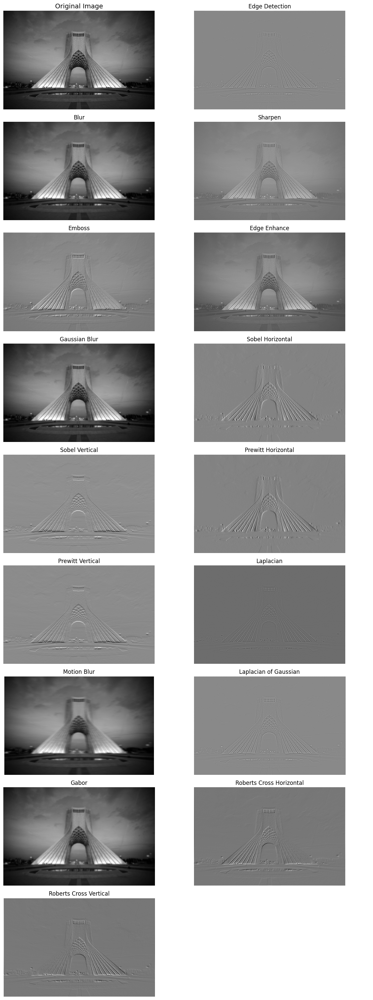

In [124]:
image_path = 'Question #1/Azadi.jpg'  #This is The path to your image you can Replace with your image
image = load_and_preprocess_image(image_path)

# Define kernels

kernels = {
    "Edge Detection": np.array([[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]]),
    "Blur": np.ones((3, 3)) / 9,
    "Sharpen": np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]]),
    "Emboss": np.array([[-2, -1, 0], [-1, 1, 1], [0, 1, 2]]),
    "Edge Enhance": np.array([[0, -0.5, 0], [-0.5, 3, -0.5], [0, -0.5, 0]]),
    "Gaussian Blur": np.array([[1/16, 1/8, 1/16], [1/8, 1/4, 1/8], [1/16, 1/8, 1/16]]),
    "Sobel Horizontal": np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]]),
    "Sobel Vertical": np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]]),
    "Prewitt Horizontal": np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]]),
    "Prewitt Vertical": np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]]),
    "Laplacian": np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]]),
    "Motion Blur": np.array([[1/9]*9] * 3),  # 3x3 motion blur
    "Laplacian of Gaussian": np.array([[0, 0, -1, 0, 0], [0, -1, -2, -1, 0], [-1, -2, 16, -2, -1], [0, -1, -2, -1, 0], [0, 0, -1, 0, 0]]),
    "Gabor": np.array([[1, 4, 6, 4, 1], [4, 11, 16, 11, 4], [6, 16, 25, 16, 6], [4, 11, 16, 11, 4], [1, 4, 6, 4, 1]]),
    "Roberts Cross Horizontal": np.array([[1, 0], [0, -1]]),
    "Roberts Cross Vertical": np.array([[0, 1], [-1, 0]]),
}

convolved_images = []
titles = []

for title, kernel in kernels.items():
    convolved_img = convolve_2d_two_loops(image, kernel, stride=1, pad=1)  # Adjust stride and pad as needed
    convolved_images.append(convolved_img)
    titles.append(title)

display_images(image, convolved_images, titles, "Question #1/Applying All Filters.jpeg")

<br>
<font>
<div dir="ltr" align="center">
    <br>
    <font color="green" size="7" style="font-family:Arial, sans-serif;">
        Section #2<br>
    </font>
</div>


<br>
<font>
<div dir="ltr" align="center">
    <br>
    <font color="Blue" size="6" style="font-family:Arial, sans-serif;">
        Subsection A: Denoising<br>
    </font>
</div>


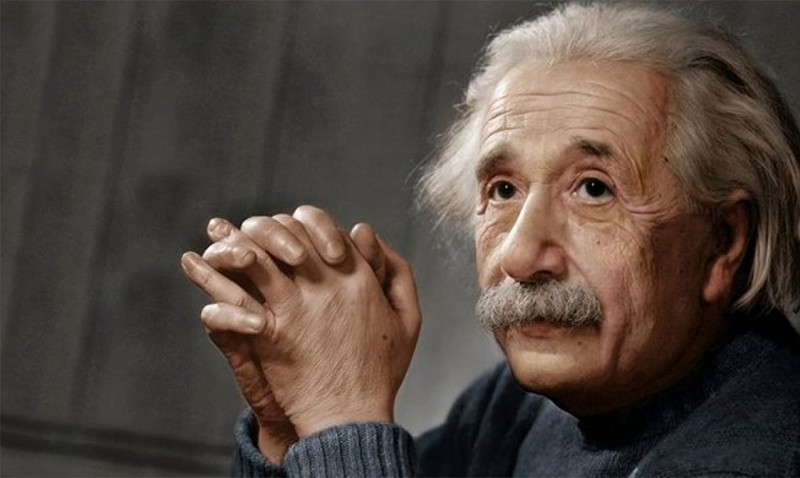

In [76]:
Image("Einstein.jpeg")

### Adding Noise to the Image

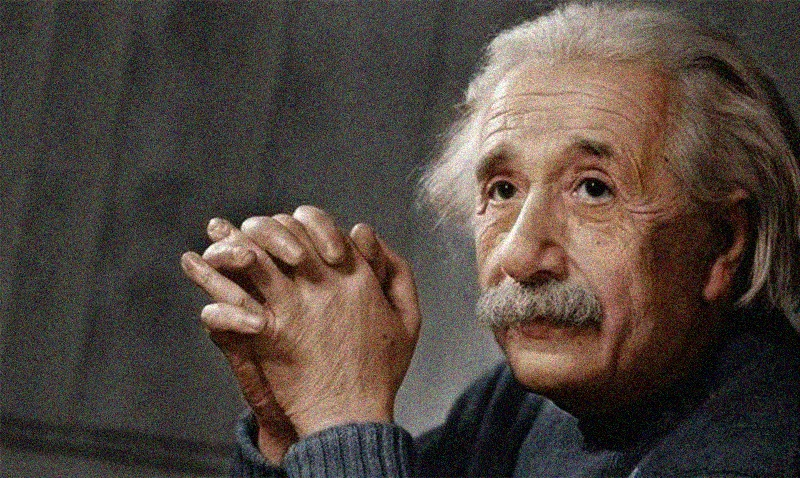

In [19]:
# Loadin Image
image = cv2.imread("Einstein.jpeg")
# image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Setting Hyperparameters for Gaussian Noise
mean_gaussian_noise = 0
std_gaussian_noise = 20

# Creating Gaussian Noise
noise = np.random.normal(mean_gaussian_noise, std_gaussian_noise, (image.shape))

# Creating Noisy Image
image_noisy = image + noise

# Clipping Pixel Intensty Between [0, 255]
image_noisy = np.clip(image_noisy, a_min=0.0, a_max=255.0)
image_noisy = image_noisy.astype("int16")

# Saving and Displaying Image
cv2.imwrite("Question #2/A/Einstein_Noisy.jpeg", image_noisy)
Image("Question #2/A/Einstein_Noisy.jpeg")

### Denoising Using Median Blur

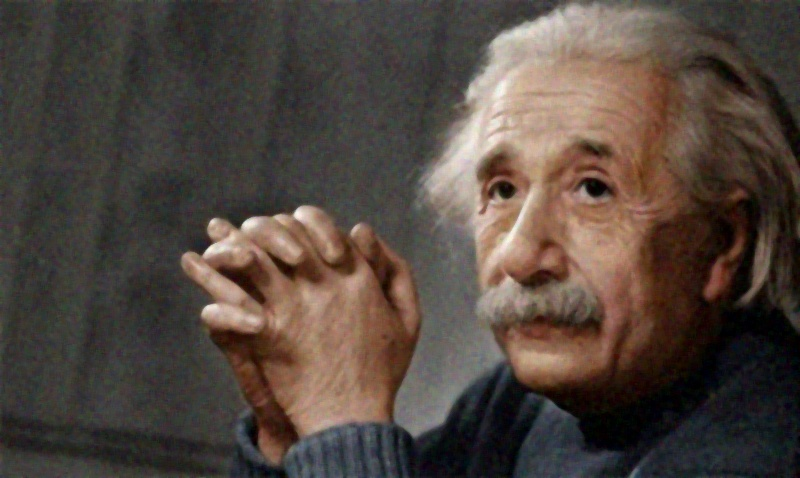

In [27]:
# Hyperparameter of Median BLur
median_blur_kernel_size = 5

# Applying Median Blur Kernel
image_denoised_median = cv2.medianBlur(image_noisy, median_blur_kernel_size)

# Saving and Displaying Image
cv2.imwrite("Question #2/A/Einstein_Denoised_Median_Blur.jpeg", image_denoised_median)
Image("Question #2/A/Einstein_Denoised_Median_Blur.jpeg")

### Denoising Using Gaussian Blur

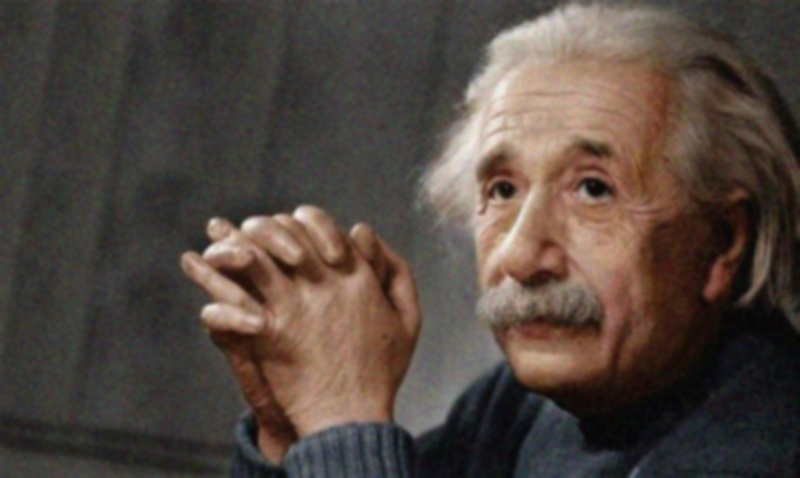

In [21]:
# Hyperparameter for Gaussian Blur Kernel
gaussian_blur_kernel_size = 9

# Applying Gaussian Blur
image_denoised_gaussian = cv2.GaussianBlur(image_noisy, (gaussian_blur_kernel_size, gaussian_blur_kernel_size), 0)

# Saving and Displaying Image
cv2.imwrite("Question #2/A/Einstein_Denoised_Gaussian_Blur.jpeg", image_denoised_gaussian)
Image("Question #2/A/Einstein_Denoised_Gaussian_Blur.jpeg")

### Looking at Fourier Transform of Noisified and Denoised Images

In [28]:
def fourier_transform(image, title, address=None):
    """
    Perform Fourier Transform on an image and display it.
    """

    # Compute the 2D Fourier Transform
    f_transform = np.fft.fft2(image)
    f_transform_shifted = np.fft.fftshift(f_transform)

    # Compute the magnitude spectrum (log scale)
    magnitude_spectrum = 20 * np.log(np.abs(f_transform_shifted))

    # Plot the original image and its magnitude spectrum
    plt.figure(figsize=(18, 5))

    plt.subplot(1, 2, 1)
    plt.title("Original Image")
    plt.imshow(image, cmap="gray")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.title("Fourier Transform (Magnitude Spectrum)")
    plt.imshow(magnitude_spectrum, cmap="gray")
    plt.axis("off")

    plt.suptitle(title)
    plt.tight_layout()
    if address is not None:
        plt.savefig(address)
    plt.show()

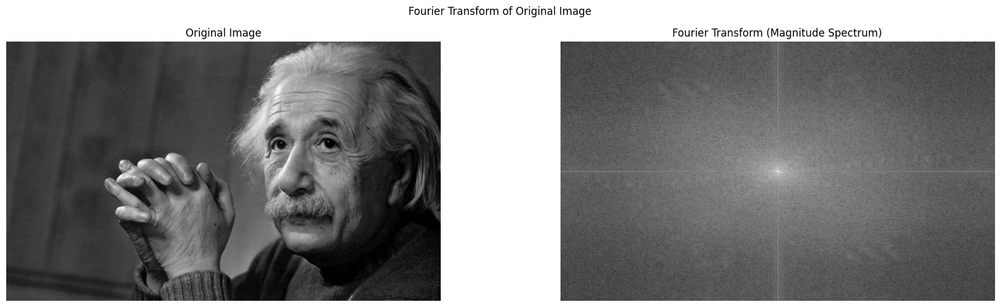

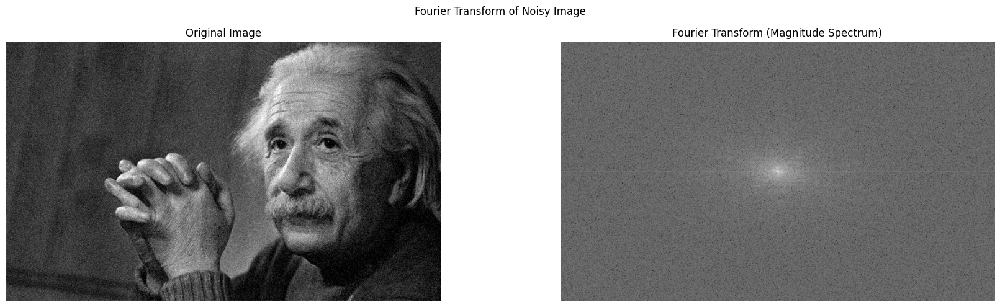

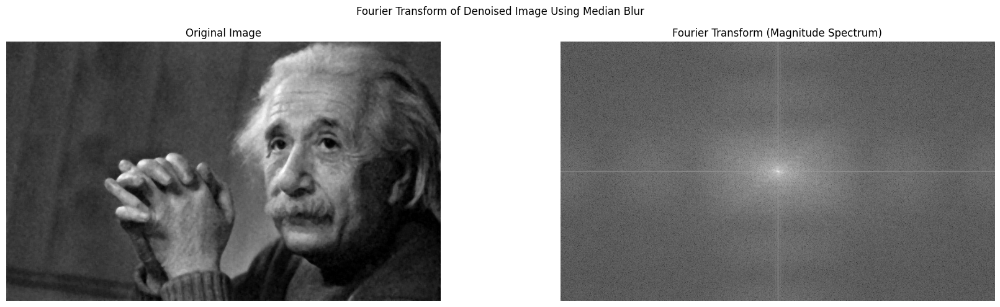

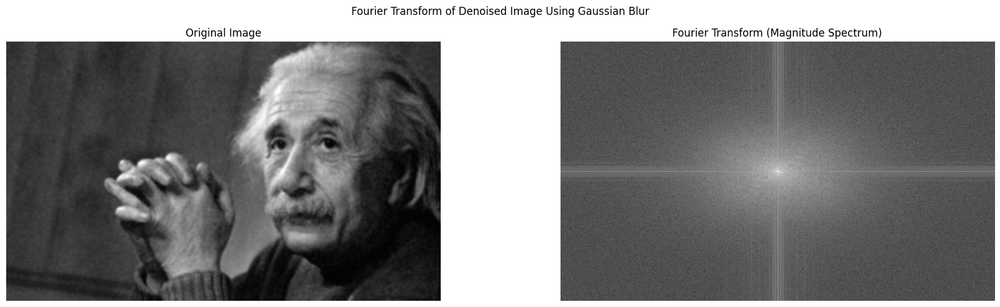

In [29]:
# Looking at Fourier Transform of Resulting Images
fourier_transform(
    image=np.median(image, axis=2),
    title="Fourier Transform of Original Image",
    address="Question #2/A/Fourier Transform of Original Image.jpeg",
)

fourier_transform(
    image=np.median(image_noisy, axis=2),
    title="Fourier Transform of Noisy Image",
    address="Question #2/A/Fourier Transform of Noisy Image.jpeg",
)

fourier_transform(
    image=np.median(image_denoised_median, axis=2),
    title="Fourier Transform of Denoised Image Using Median Blur",
    address="Question #2/A/Fourier Transform of Denoised Image Using Median Blur.jpeg",
)

fourier_transform(
    image=np.median(image_denoised_gaussian, axis=2),
    title="Fourier Transform of Denoised Image Using Gaussian Blur",
    address="Question #2/A/Fourier Transform of Denoised Image Using Gaussian Blur.jpeg",
)

<br>
<font>
<div dir="ltr" align="center">
    <br>
    <font color="Blue" size="6" style="font-family:Arial, sans-serif;">
        Subsection B: Edge Detection<br>
    </font>
</div>


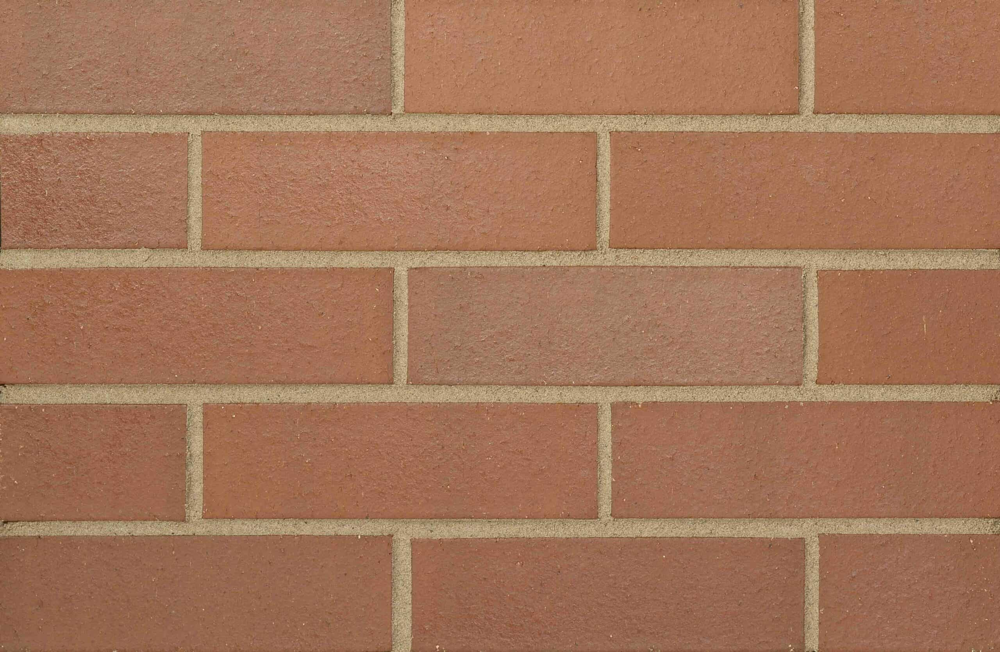

In [30]:
Image("Question #2/B/bricks.jpg", width=600)

### Sobel Edge Detection

In [31]:
# Loading Image
bricks = cv2.imread("Question #2/B/bricks.jpg")

# Making Grayscale bricks
bricks = cv2.cvtColor(bricks, cv2.COLOR_RGB2GRAY)

# Applying Gaussian Blur
bricks = cv2.GaussianBlur(bricks, (7, 7), 0)

# Applying Sobel Kernel Using OpenCV
bricks_sobel_x = cv2.Sobel(bricks, cv2.CV_64F, 1, 0, ksize=5) 
bricks_sobel_y = cv2.Sobel(bricks, cv2.CV_64F, 0, 1, ksize=5)

# Applying Sobel Kernel without Using OpenCV
bricks_sobel_x = convolve_2d_two_loops(bricks, kernels["Sobel Horizontal"])
bricks_sobel_y = convolve_2d_two_loops(bricks, kernels["Sobel Vertical"])

cv2.imwrite("Question #2/B/Sobel_X.jpeg", bricks_sobel_x)
cv2.imwrite("Question #2/B/Sobel_Y.jpeg", bricks_sobel_y)

NameError: name 'convolve_2d_two_loops' is not defined

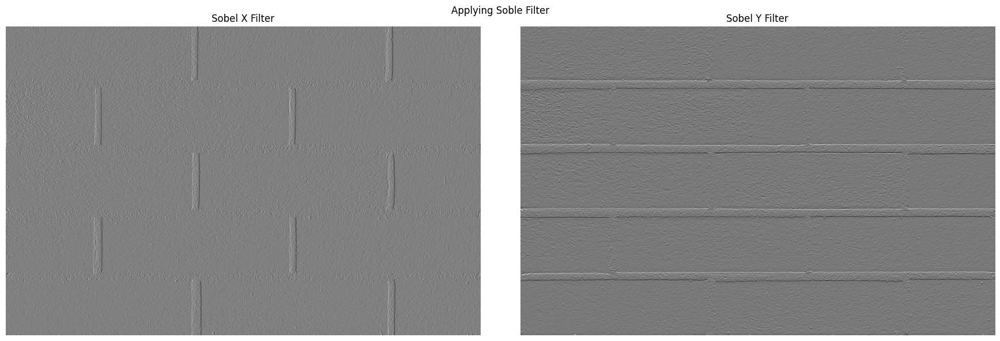

In [132]:
# Displaying Sobel Edge Detection
plt.figure(figsize=(18, 6))

plt.subplot(1, 2, 1)
plt.imshow(bricks_sobel_x, cmap="gray")
plt.title("Sobel X Filter")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(bricks_sobel_y, cmap="gray")
plt.title("Sobel Y Filter")
plt.axis("off")

plt.suptitle("Applying Soble Filter")
plt.tight_layout()
plt.savefig("Question #2/B/Sobel.jpeg")
plt.show()

### Canny Edge Detection

Canny Edge Detection
Canny edge detection is a multi-stage process that includes noise reduction, gradient calculation, non-maximum suppression, and edge tracking by hysteresis. It does not have a single kernel but uses several filters and steps:

1. Gaussian Filter: Used to smooth the image and reduce noise.

2. Gradient Calculation: Uses the Sobel operator to calculate gradients.

3. Non-Maximum Suppression: Thins out the edges.

4. Double Threshold and Edge Tracking: Identifies strong, weak, and non-relevant edges.

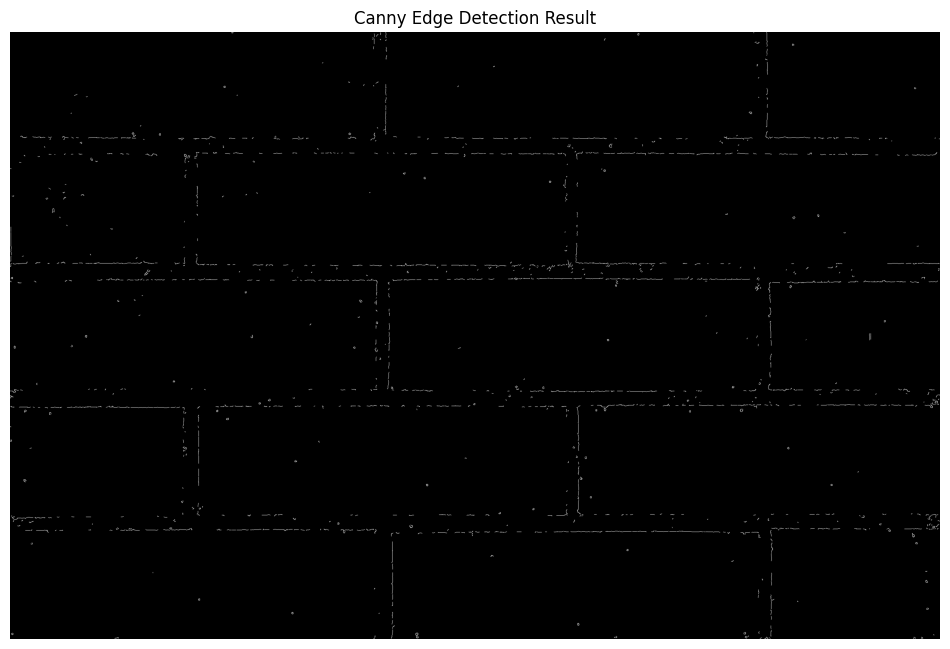

In [32]:
# Applying Canny Edge Detection Using OpenCV
canny_edges = cv2.Canny(bricks, 100, 130)

plt.figure(figsize=(12, 8))
plt.imshow(canny_edges, cmap="gray")
plt.axis("off")
plt.title("Canny Edge Detection Result")
plt.savefig("Question #2/B/Canny.jpeg")
plt.show()

<br>
<font>
<div dir="ltr" align="center">
    <br>
    <font color="Blue" size="6" style="font-family:Arial, sans-serif;">
        Subsection C: Sharpening Operator<br>
    </font>
</div>


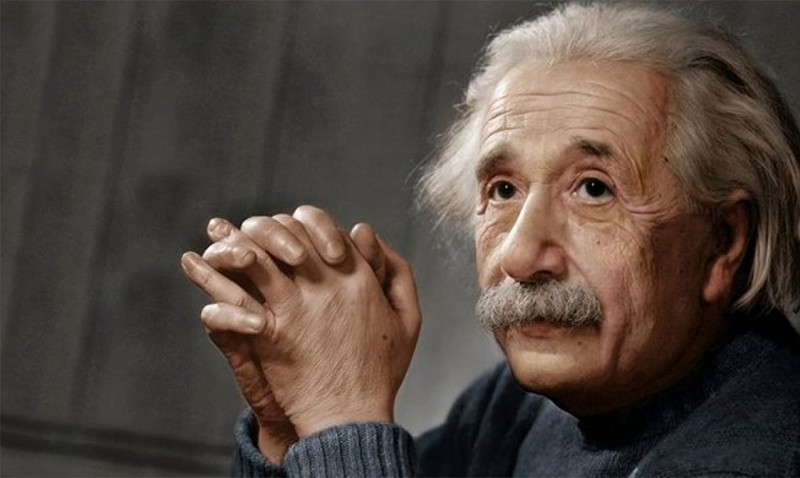

In [114]:
Image("Einstein.jpeg")

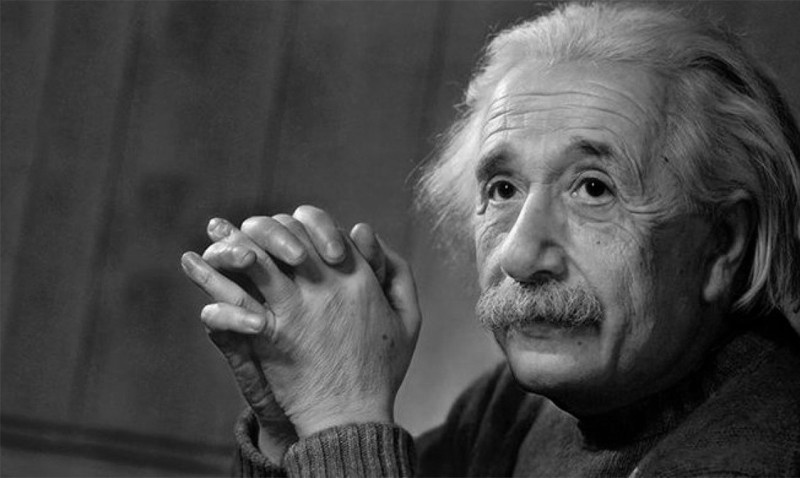

In [136]:
# Loading Image
image = cv2.imread("Einstein.jpeg")

# Grayscale Image
image_gray = np.mean(image, axis=2)

# Saving and Displaying Grayscale Image
cv2.imwrite("Einstein_Gray.jpeg", image_gray)
Image("Einstein_Gray.jpeg")

### Basic Sharpening

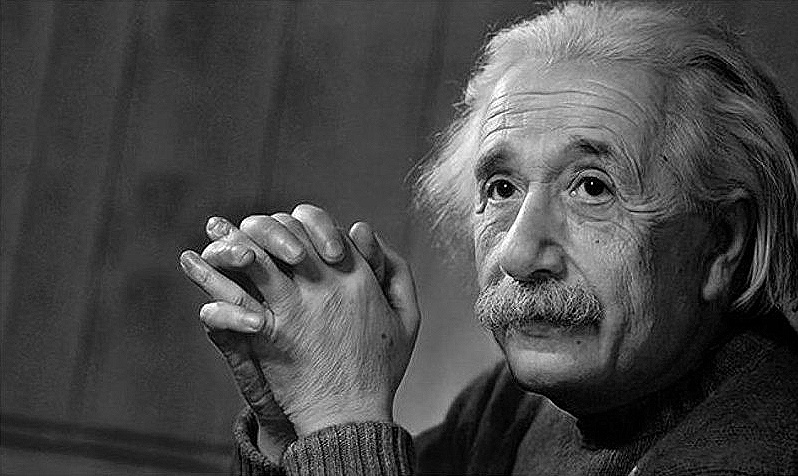

In [137]:
# Sharpening Kernel
kernel = np.array([
    [0, -1,  0], 
    [-1, 5, -1], 
    [0, -1,  0]
])

# Applying Sharpening Kernel
image_sharpen = convolve_2d_two_loops(kernel=kernel, image=image_gray)

# Saving and Displaying Sharped Image
cv2.imwrite("Question #2/C/Basic_Sharpening.jpeg", image_sharpen)
Image("Question #2/C/Basic_Sharpening.jpeg")

### Laplacian of Gaussian (LoG)

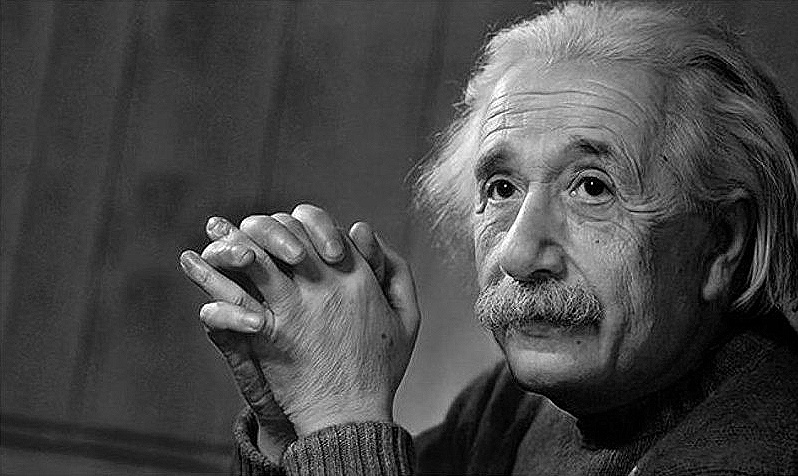

In [139]:
# Apply Gaussian blur
blurred = cv2.GaussianBlur(image_gray, (3, 3), 0) 

# Apply Laplacian filter 
laplacian = cv2.Laplacian(blurred, cv2.CV_64F) 

# Add the Laplacian to the original image to enhance edges 
sharpened_image = cv2.addWeighted(image_gray, 1.5, laplacian, -0.5, 0)

# Saving and Displaying Sharped Image
cv2.imwrite("Question #2/C/LoG_Sharpening.jpeg", image_sharpen)
Image("Question #2/C/LoG_Sharpening.jpeg")

### Unsharp Masking

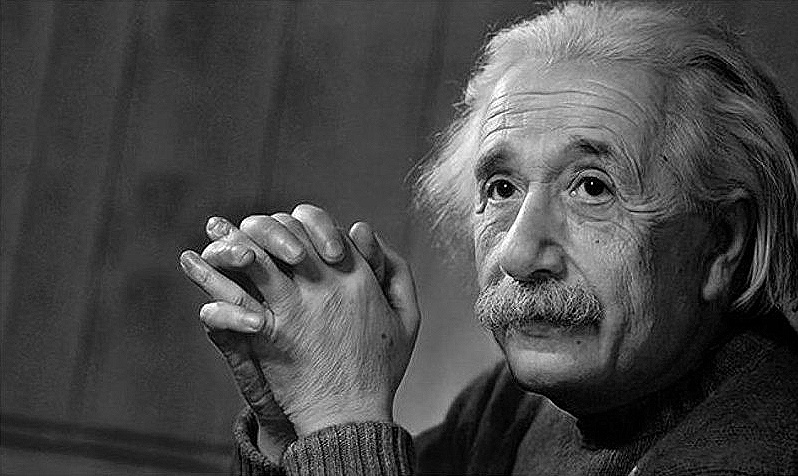

In [140]:
# Setting Hyperparameters for Unsharp Masking
strength = 1.5
sigma = 1.5

# Apply Gaussian blur 
blurred = cv2.GaussianBlur(image_gray, (0, 0), sigma) 
# Compute the unsharp mask 
unsharp_mask = cv2.addWeighted(image_gray, 1.0 + strength, blurred, -strength, 0)

# Saving and Displaying Sharped Image
cv2.imwrite("Question #2/C/Unsharp_Masking_Sharpening.jpeg", image_sharpen)
Image("Question #2/C/Unsharp_Masking_Sharpening.jpeg")

<br>
<font>
<div dir="ltr" align="center">
    <br>
    <font color="Blue" size="6" style="font-family:Arial, sans-serif;">
        Subsection D: Blurring<br>
    </font>
</div>


In [141]:
# Defining Blurring Filters
blurring_kernels = {
    "Blur": np.ones((3, 3)) / 9,
    "Gaussian": np.array([[1/16, 1/8, 1/16], [1/8, 1/4, 1/8], [1/16, 1/8, 1/16]]),
    "Motion": np.array([[1/9]*9] * 3),  
}

In [142]:
# Blurring Hyperparameter
ksize = 7

# Blurring without Using OpenCV
# average_blur = convolve_2d_two_loops(image_gray, blurring_kernels["Blur"])
# gaussian_blur = convolve_2d_two_loops(image_gray, blurring_kernels["Gaussian"])
# motion_blur = convolve_2d_two_loops(image_gray, blurring_kernels["Motion"])
# median_blur = cv2.medianBlur(cv2.cvtColor(image, cv2.COLOR_RGB2GRAY), 3)

# Blurring Using OpenCV
average_blur = cv2.blur(image_gray, (ksize, ksize))
gaussian_blur = cv2.GaussianBlur(image_gray, (ksize, ksize), 0)
motion_blur = convolve_2d_two_loops(image_gray, blurring_kernels["Motion"])
median_blur = cv2.medianBlur(cv2.cvtColor(image, cv2.COLOR_RGB2GRAY), ksize)

# Saving Blurred Images
cv2.imwrite("Question #2/D/Average_Blur.jpeg", average_blur)
cv2.imwrite("Question #2/D/Gaussian_Blur.jpeg", gaussian_blur)
cv2.imwrite("Question #2/D/Motion_Blur.jpeg", motion_blur)
cv2.imwrite("Question #2/D/Median_Blur.jpeg", median_blur)

True

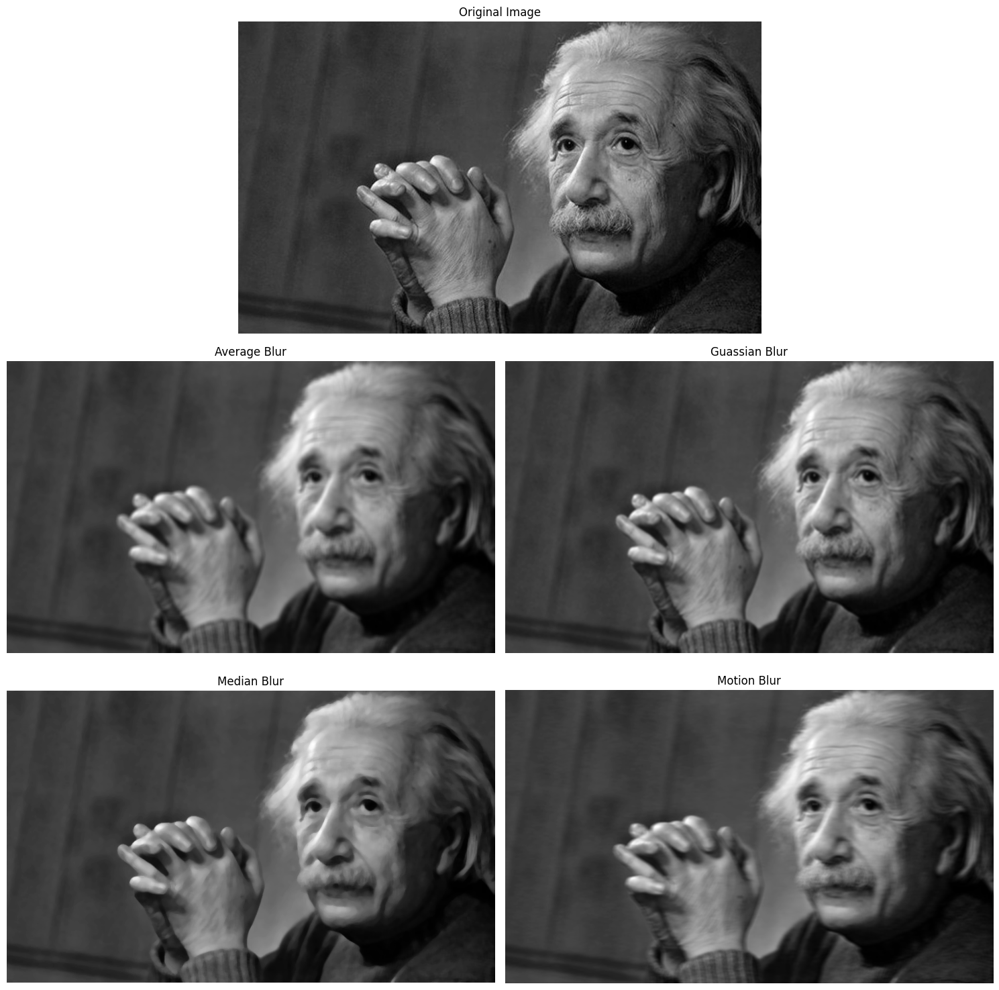

In [121]:
# Displaying Blurred Images
plt.figure(figsize=(15, 15))

plt.subplot(3, 2, (1, 2))
plt.imshow(image_gray, cmap="gray")
plt.axis("off")
plt.title("Original Image")

plt.subplot(3, 2, 3)
plt.imshow(average_blur, cmap="gray")
plt.axis("off")
plt.title("Average Blur")

plt.subplot(3, 2, 4)
plt.imshow(gaussian_blur, cmap="gray")
plt.axis("off")
plt.title("Guassian Blur")

plt.subplot(3, 2, 5)
plt.imshow(median_blur, cmap="gray")
plt.axis("off")
plt.title("Median Blur")

plt.subplot(3, 2, 6)
plt.imshow(motion_blur, cmap="gray")
plt.axis("off")
plt.title("Motion Blur")

plt.tight_layout()
plt.savefig("Question #2/D/Comparison.jpeg")
plt.show()

<br>
<font>
<div dir="ltr" align="center">
    <br>
    <font color="Blue" size="6" style="font-family:Arial, sans-serif;">
        Subsection E: Applying Filters<br>
    </font>
</div>


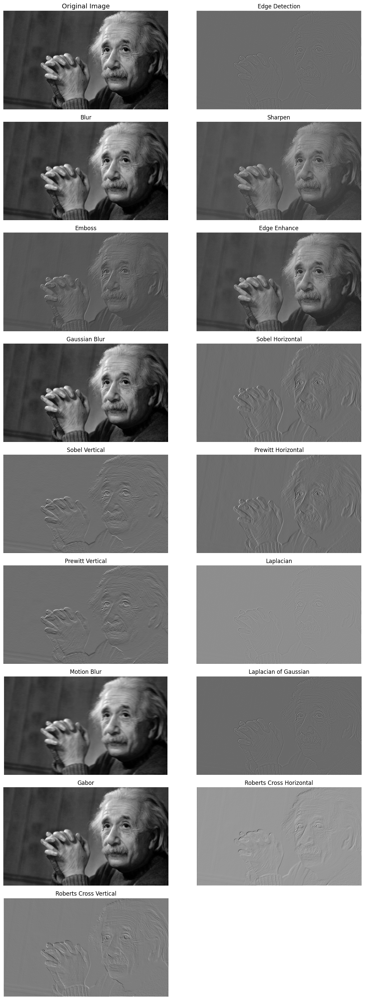

In [143]:
# Applying all Filters on Image
convolved_images = []
titles = []

for title, kernel in kernels.items():
    convolved_img = convolve_2d_two_loops(image_gray, kernel, stride=1, pad=1) 
    convolved_images.append(convolved_img)
    titles.append(title)

display_images(image_gray, convolved_images, titles, "Question #2/E/Applying All Filters.jpeg")